# <div style="border-radius: 20px 0 20px 0px; border: 4px white; padding: 10px; background-color: #A26CC6; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);color: white; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin: 5px; font-size: 36px;">🍁Plant Leaf Disease Detection🍁</div>

# <div style="border-radius: 20px 0 20px 0px; border: 4px white; padding: 10px; background-color: #A26CC6; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);color: white; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin: 5px; font-size: 30px;">Importing Dependencies</div>

In [2]:
import os
import cv2
import random
import warnings
import numpy as np
import pandas as pd
import pickle as pkl
import mahotas as mt
import seaborn as sns
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt
from catboost import CatBoostClassifier
from IPython.display import Image, display
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import classification_report, confusion_matrix, f1_score, accuracy_score, precision_score, recall_score

warnings.filterwarnings('ignore')

# <div style="border-radius: 20px 0 20px 0px; border: 4px white; padding: 10px; background-color: #A26CC6; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);color: white; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin: 5px; font-size: 30px;">Loading Data & Visualizing Sample Data</div>

<div style="border-radius: 10px; border: 4px white; padding: 10px; background-color: #9F95A5; text-align: left; color: white; margin: 5px; font-size: 16px;">By 2050, global food production must increase by an estimated 70% to meet the needs of a projected population exceeding 9 billion. Infectious diseases currently account for an average 40% reduction in potential crop yields, with some farmers, particularly in developing regions, facing losses as high as 100%.<br><br>With the expected proliferation of 5 billion smartphones worldwide by 2020, smartphones offer a unique opportunity for improving crop management. Mobile disease diagnostics, powered by machine learning and crowdsourcing, could become an invaluable tool for farmers.<br><br>This dataset, released through the PlantVillage platform, contains over 50,000 high-quality images of both healthy and infected crop leaves. It is a foundational resource aimed at supporting the development of computer vision solutions to mitigate yield losses due to crop diseases.
</div>

In [3]:
# root folder path
root_folder = "/kaggle/input/plantvillage-dataset/color"

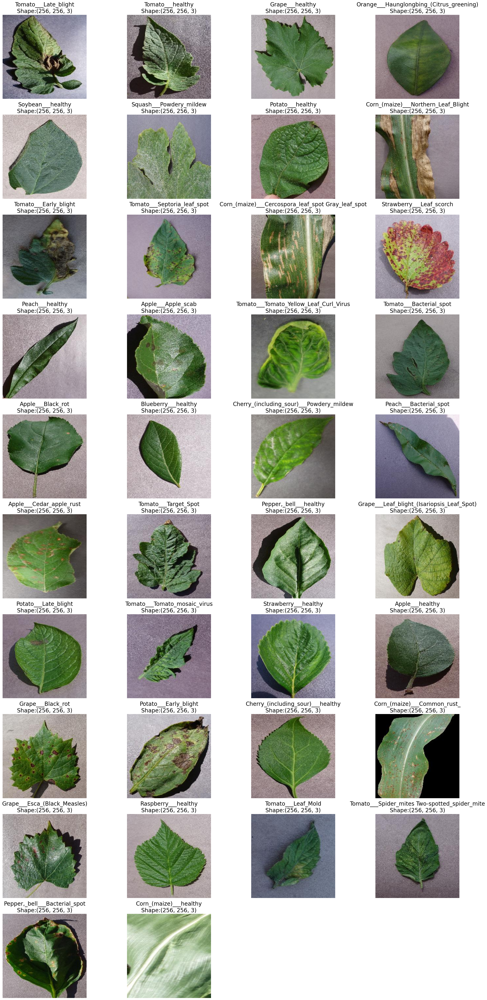

In [4]:
# List all subfolders (categories of plant leaves)
subfolders = [f for f in os.listdir(root_folder) if os.path.isdir(os.path.join(root_folder, f))]

# Create subplots
fig, axes = plt.subplots(ncols=4, nrows=10, figsize=(25, 50))
axes = axes.flatten()  # Flatten to easily iterate over them

# Loop through subfolders and display one image from each
for idx, subfolder in enumerate(subfolders):
    subfolder_path = os.path.join(root_folder, subfolder)
    image_files = os.listdir(subfolder_path)
    
    if len(image_files) > 0:
        # Pick the first image from the folder
        image_path = os.path.join(subfolder_path, image_files[0])
        
        # Read the image
        image = cv2.imread(image_path)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        shape = image_rgb.shape
        
        # Display the image in the corresponding subplot
        axes[idx].imshow(image_rgb)
        axes[idx].set_title(f"{subfolder}\nShape:{shape}", size=20)
        axes[idx].axis('off')

# Remove extra subplots (if there are any)
for idx in range(38, 40):
    fig.delaxes(axes[idx])

# Display the grid of images
plt.tight_layout()
plt.show()

<div style="border-radius: 10px; border: 4px white; padding: 10px; background-color: #9F95A5; text-align: left; color: white; margin: 5px; font-size: 16px;">Note: Here we can clearly see that all images are of same size that is (256, 256, 3)</div>

# <div style="border-radius: 20px 0 20px 0px; border: 4px white; padding: 10px; background-color: #A26CC6; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);color: white; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin: 5px; font-size: 30px;">Helper Functions</div>

In [114]:
# Function to visualize precision, recall, and F1 scores in subplots
def precision_recall_viz(df_list, titles):
    n = len(df_list)
    cols = 2
    rows = 5  
    
    fig, axs = plt.subplots(rows, cols, figsize=(12, 15))  
    axs = axs.flatten()  
    
    for i, (df, title) in enumerate(zip(df_list, titles)):
        df_numeric = df.set_index('Classes')  
        sns.heatmap(df_numeric, annot=True, cmap='Greens', fmt='.2f', cbar=False, 
                    linewidths=0.5, ax=axs[i])
        axs[i].set_title(title, fontsize=14, weight='bold')
        axs[i].set_xlabel('', fontsize=1)
        axs[i].set_ylabel('', fontsize=1)
        axs[i].tick_params(axis='y', rotation=0)
    
    for j in range(i + 1, len(axs)):
        axs[j].axis('off')

    plt.tight_layout()
    plt.suptitle('Performance Across Models', fontsize=16, weight='bold', y=1.02)
    plt.show()

In [64]:
def calculate_metrics_from_confusion_matrix(cm, class_labels, metrics=['precision', 'recall', 'f1']):
    # Number of classes
    num_classes = cm.shape[0]
    
    # Dictionaries to hold precision, recall, and F1-score for each class
    results = {metric: {} for metric in metrics}

    for i in range(num_classes):
        TP = cm[i, i]
        FP = cm[:, i].sum() - TP
        FN = cm[i, :].sum() - TP
        TN = cm.sum() - (TP + FP + FN)
        
        # Precision = TP / (TP + FP)
        if 'precision' in metrics:
            precision = TP / (TP + FP) if (TP + FP) > 0 else 0
            results['precision'][class_labels[i]] = precision
        
        # Recall = TP / (TP + FN)
        if 'recall' in metrics:
            recall = TP / (TP + FN) if (TP + FN) > 0 else 0
            results['recall'][class_labels[i]] = recall
        
        # F1 Score = 2 * (precision * recall) / (precision + recall)
        if 'f1' in metrics and 'precision' in results and 'recall' in results:
            precision = results['precision'][class_labels[i]]
            recall = results['recall'][class_labels[i]]
            f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
            results['f1'][class_labels[i]] = f1_score
    
    Precision = results['precision']   
    Recall = results['recall']
    F1score = results['f1']

    df = pd.DataFrame({"Classes": class_labels})

    df['Precision'] = [round(value*100, 2) for value in Precision.values()]
    df['Recall'] = [round(value*100, 2) for value in Recall.values()]
    df['F1 Score'] = [round(value*100, 2) for value in F1score.values()]   

    return df

# <div style="border-radius: 20px 0 20px 0px; border: 4px white; padding: 10px; background-color: #A26CC6; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);color: white; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin: 5px; font-size: 30px;">Image Preprocessing</div>

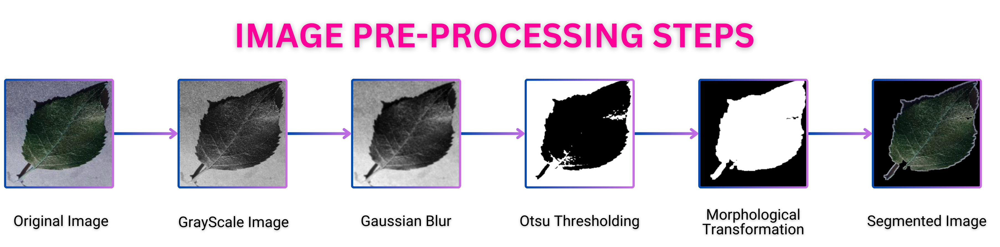

In [7]:
image_path = '/kaggle/input/images/Abstract Product Design (3).png'
display(Image(filename=image_path))

In [8]:
def image_preprocessing(image_path):
    # Load the image
    image = cv2.imread(image_path)

    # Convert to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Gaussian blur
    blur_image = cv2.GaussianBlur(gray_image, (5, 5), 0)

    # Apply Otsu's thresholding
    otsu_image = cv2.threshold(blur_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

    # Invert the thresholded image
    invert = cv2.bitwise_not(otsu_image)

    # Dilate the image
    kernel = np.ones((5, 5), np.uint8)
    dilated_image = cv2.dilate(invert, kernel, iterations=1)

    # Convert dilated image to 3-channel to match the original image
    dilated_image_3channel = cv2.cvtColor(dilated_image, cv2.COLOR_GRAY2BGR)

    # Bitwise AND operation between original image and dilated image
    result = cv2.bitwise_and(image, dilated_image_3channel)
    
    return result

# <div style="border-radius: 20px 0 20px 0px; border: 4px white; padding: 10px; background-color: #A26CC6; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);color: white; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin: 5px; font-size: 30px;">Feature Extraction With GLCM & HSV</div>

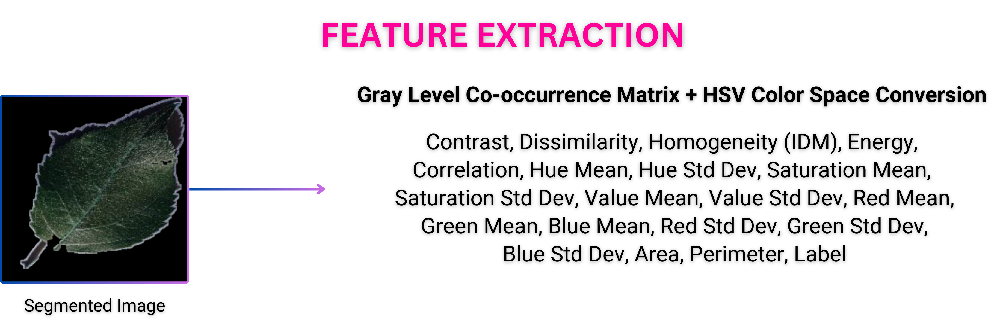

In [9]:
image_path = '/kaggle/input/images/Abstract Product Design.png'
display(Image(filename=image_path))

In [10]:
def GLCM_And_HSV_Feature_Extraction(image_path):
    # Preprocessed Image
    result = image_preprocessing(image_path)

    # Convert the result to grayscale
    gray_result = cv2.cvtColor(result, cv2.COLOR_BGR2GRAY)

    # Calculate the co-occurrence matrix using mahotas
    glcm = mt.features.haralick(gray_result)

    # Calculate the mean of each feature across all directions (0°, 45°, 90°, and 135°)
    mean_glcm = glcm.mean(axis=0)

    # Convert the result image to HSV color space
    hsv_result = cv2.cvtColor(result, cv2.COLOR_BGR2HSV)

    # Split the HSV image into individual H, S, and V channels
    h_channel, s_channel, v_channel = cv2.split(hsv_result)

    # Calculate mean and standard deviation for each HSV channel
    h_mean, h_std = np.mean(h_channel), np.std(h_channel)
    s_mean, s_std = np.mean(s_channel), np.std(s_channel)
    v_mean, v_std = np.mean(v_channel), np.std(v_channel)

    # Split the BGR image to get Red, Green, and Blue channels
    b_channel, g_channel, r_channel = cv2.split(result)

    # Calculate mean and standard deviation for each RGB channel
    red_mean, red_std = np.mean(r_channel), np.std(r_channel)
    green_mean, green_std = np.mean(g_channel), np.std(g_channel)
    blue_mean, blue_std = np.mean(b_channel), np.std(b_channel)

    # Threshold the grayscale image to extract contours for area and perimeter calculation
    _, thresholded = cv2.threshold(gray_result, 128, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(thresholded, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Calculate area and perimeter (if contours are found)
    area = perimeter = 0
    if contours:
        # Assuming the largest contour represents the object
        largest_contour = max(contours, key=cv2.contourArea)
        area = cv2.contourArea(largest_contour)
        perimeter = cv2.arcLength(largest_contour, True)

   
    # Define the names of the features we are interested in
    selected_feature_names = [
        'Contrast',
        'Dissimilarity',
        'Homogeneity (IDM)',
        'Energy',
        'Correlation',
        'Hue Mean',
        'Hue Std Dev',
        'Saturation Mean',
        'Saturation Std Dev',
        'Value Mean',
        'Value Std Dev',
        'Red Mean',
        'Green Mean',
        'Blue Mean',
        'Red Std Dev',
        'Green Std Dev',
        'Blue Std Dev',
        'Area',
        'Perimeter',
    ]

    # Select the corresponding indices for the features
    selected_features = [
        mean_glcm[1], mean_glcm[2], mean_glcm[4], mean_glcm[0], mean_glcm[2],
        h_mean, h_std, s_mean, s_std, v_mean, v_std,
        red_mean, green_mean, blue_mean, red_std, green_std, blue_std,
        area, perimeter
    ]

    # Create a pandas DataFrame to hold the selected features
    df = pd.DataFrame([selected_features], columns=selected_feature_names)

    return df

In [11]:
def Feature_Extraction(Plant):
    main_df = pd.DataFrame()

    for plant_leaf in os.listdir(root_folder):
        if str(plant_leaf).__contains__(str(Plant).capitalize()):
            plant_leaf_folder = os.path.join(root_folder, plant_leaf)

            for image in os.listdir(plant_leaf_folder):  
                image_path = os.path.join(plant_leaf_folder, image) 
                temp_df = GLCM_And_HSV_Feature_Extraction(image_path)
                temp_df['Label'] = plant_leaf
                main_df = pd.concat([main_df, temp_df], ignore_index=True)            

    return main_df

# List of plants to extract features from
plants = ["Apple", "Peach", "Cherry", "Corn", "Grape", "Pepper", "Potato", "Tomato", "Strawberry"]

combined_plant_dfs = {}

# Extracting Features for all plants with a progress bar
for plant in tqdm(plants, desc="Extracting Features", unit="plant"):
    combined_plant_dfs[plant] = Feature_Extraction(Plant=plant)

Extracting Features: 100%|██████████| 9/9 [42:03<00:00, 280.34s/plant]


# <div style="border-radius: 20px 0 20px 0px; border: 4px white; padding: 10px; background-color: #A26CC6; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);color: white; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin: 5px; font-size: 30px;">Model Training</div>

In [12]:
def train_model(data):
    # Split data into features and target variable
    X = data.drop('Label', axis=1)
    y = data['Label']

    # Split the dataset into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

    # Create a Random Forest Classifier
    cb_model = CatBoostClassifier(iterations=2000, learning_rate=0.1, depth=5, random_seed=42, verbose=0)
    
    # Train the model
    cb_model.fit(X_train, y_train)
    
    # Make predictions
    y_pred = cb_model.predict(X_test)
    
    # Classes
    classes = cb_model.classes_
    
    # Return the trained model
    return cb_model, y_test, y_pred, classes

In [13]:
plant_names = ["Apple", "Peach", "Cherry", "Corn", "Grape", "Pepper", "Potato", "Tomato", "Strawberry"]

Plants = []
Accuracy = []  
F1Score = []  
ConfusionMatrix = [] 
Classes = []

for plants in plant_names:
    print("≡≡"*10, plants,"≡≡"*10)
    model, y_test, y_pred, classes = train_model(combined_plant_dfs[plants])
        
    Plants.append(plants)
    Accuracy.append(round(accuracy_score(y_test, y_pred)*100))
    F1Score.append(round(f1_score(y_test, y_pred, average='macro')*100))
    ConfusionMatrix.append(confusion_matrix(y_test, y_pred))
    Classes.append(classes)
    
    print(f"{plants} Model Training Completed ✔️")

≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡ Apple ≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡
Apple Model Training Completed ✔️
≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡ Peach ≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡
Peach Model Training Completed ✔️
≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡ Cherry ≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡
Cherry Model Training Completed ✔️
≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡ Corn ≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡
Corn Model Training Completed ✔️
≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡ Grape ≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡
Grape Model Training Completed ✔️
≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡ Pepper ≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡
Pepper Model Training Completed ✔️
≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡ Potato ≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡
Potato Model Training Completed ✔️
≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡ Tomato ≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡
Tomato Model Training Completed ✔️
≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡ Strawberry ≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡
Strawberry Model Training Completed ✔️


# <div style="border-radius: 20px 0 20px 0px; border: 4px white; padding: 10px; background-color: #A26CC6; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);color: white; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin: 5px; font-size: 30px;">Model Evaluation</div>

In [14]:
# Creating a DataFrame to Store Model Performance
Models_df = pd.DataFrame({"Plant":Plants, 
                          "Accuracy": Accuracy,
                          "F1 Score": F1Score,
                          "Confusion Matrix": ConfusionMatrix,
                          "Classes": Classes})

def cleaning_labels(data):
    list_ = []
    for i in data:
        list_.append(", ".join(str(i).split("___")[1:]))
    return list_
Models_df['Classes'] = Models_df['Classes'].apply(cleaning_labels)

Models_df[['Plant','Accuracy', 'F1 Score']].style.background_gradient(cmap='Blues')

,Plant,Accuracy,F1 Score
0,Apple,90,87
1,Peach,99,98
2,Cherry,97,97
3,Corn,88,82
4,Grape,91,91
5,Pepper,93,92
6,Potato,91,88
7,Tomato,83,78
8,Strawberry,97,96


## <div style="border-radius: 5px; border: 4px white; padding: 10px; background-color: #D492FF; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);color: white; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin: 5px; font-size: 25px;">Accuracy & F1 Score</div>

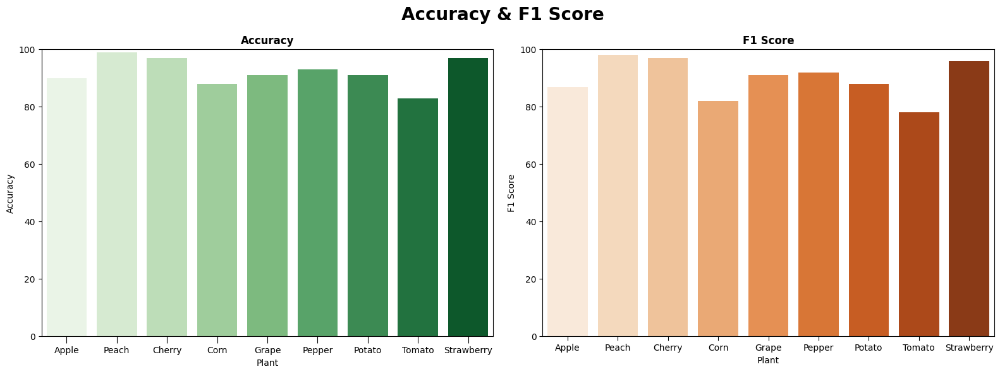

In [116]:
fig, axs = plt.subplots(1, 2, figsize=(16, 6))

sns.barplot(x='Plant', y='Accuracy', data=Models_df, ax=axs[0], palette='Greens')
axs[0].set_title('Accuracy', weight='bold')
axs[0].set_ylim(0, 100)
axs[0].tick_params(axis='x', size=8)

sns.barplot(x='Plant', y='F1 Score', data=Models_df, ax=axs[1], palette='Oranges')
axs[1].set_title('F1 Score', weight='bold')
axs[1].set_ylim(0, 100)
axs[1].tick_params(axis='x', size=5)


plt.suptitle("Accuracy & F1 Score", size=20, weight='bold')
plt.tight_layout()
plt.show()

## <div style="border-radius: 5px; border: 4px white; padding: 10px; background-color: #D492FF; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);color: white; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin: 5px; font-size: 25px;">Confusion Matrices For Different Models</div>

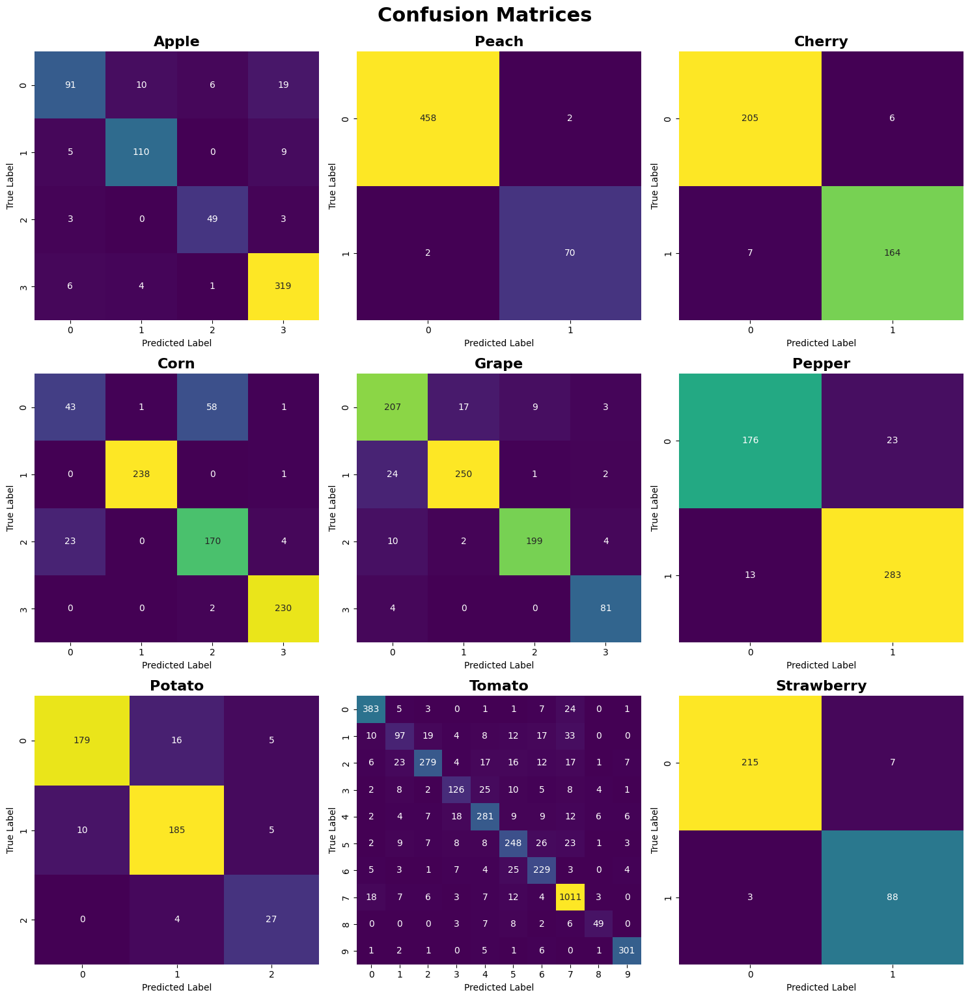

In [117]:
# Set up the figure for confusion matrices
fig, axs = plt.subplots(3, 3, figsize=(15, 15))  
axs = axs.flatten()  

tick_labels = Models_df['Classes']

for i, cm in enumerate(Models_df['Confusion Matrix']):
    sns.heatmap(cm, annot=True, fmt='d', cmap='viridis', ax=axs[i], cbar=False)
    axs[i].set_title(f'{Models_df["Plant"][i]}', weight='bold', size=16)
    axs[i].set_xlabel('Predicted Label')
    axs[i].set_ylabel('True Label')

for j in range(i + 1, len(axs)):
    axs[j].axis('off')

plt.tight_layout()
plt.suptitle('Confusion Matrices', size=22, weight='bold', y=1.02)
plt.show()

## <div style="border-radius: 5px; border: 4px white; padding: 10px; background-color: #D492FF; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);color: white; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin: 5px; font-size: 25px;">Precision, Recall & F1 Score Across Different Models</div>

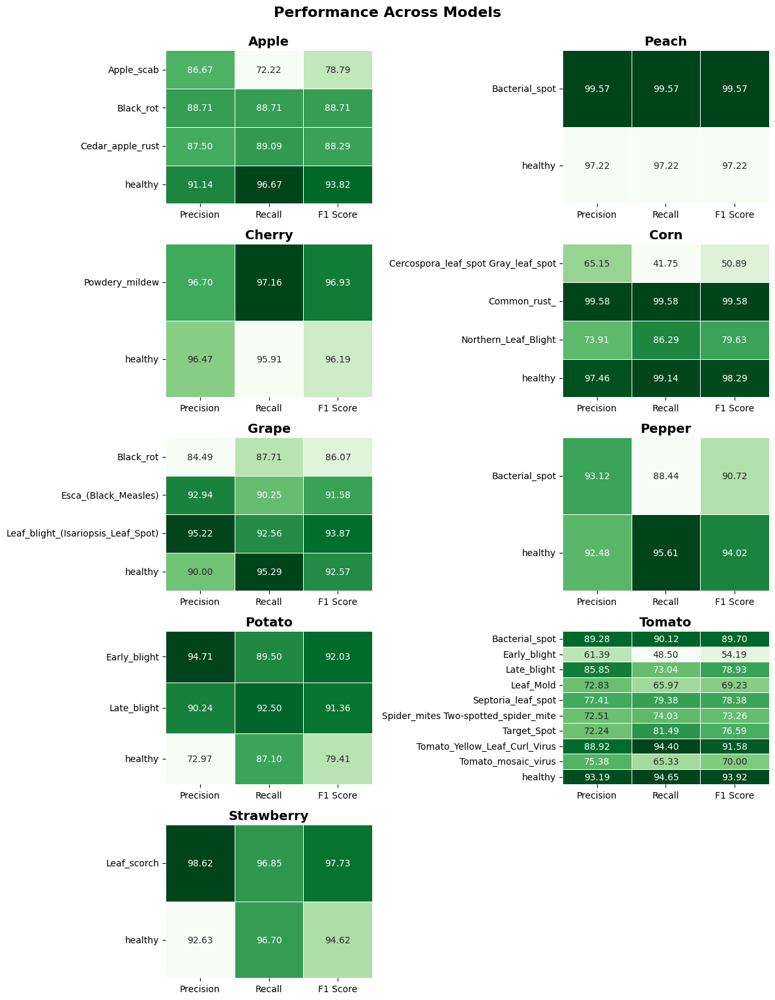

In [118]:
metrics_dfs = []
titles = []

for i in range(len(Models_df)):
    cm = Models_df['Confusion Matrix'][i]
    cl = Models_df['Classes'][i]
    metrics_df = calculate_metrics_from_confusion_matrix(cm, cl, metrics=['precision', 'recall', 'f1'])
    metrics_dfs.append(metrics_df)
    titles.append(Models_df['Plant'][i])

precision_recall_viz(metrics_dfs, titles)